In [16]:
# Instalando o pandas profiling (executar apenas na 1a vez, depois comente esta linha)
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
!pip install missingno

810.09s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


817.98s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


In [26]:
# Configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

# Importação de pacotes
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import missingno as ms
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import cm

In [2]:
# Informa a URL de importação do dataset
url = "https://raw.githubusercontent.com/tatianaesc/datascience/main/diabetes.csv"

# Lê o arquivo 
dataset = pd.read_csv(url, delimiter=',')

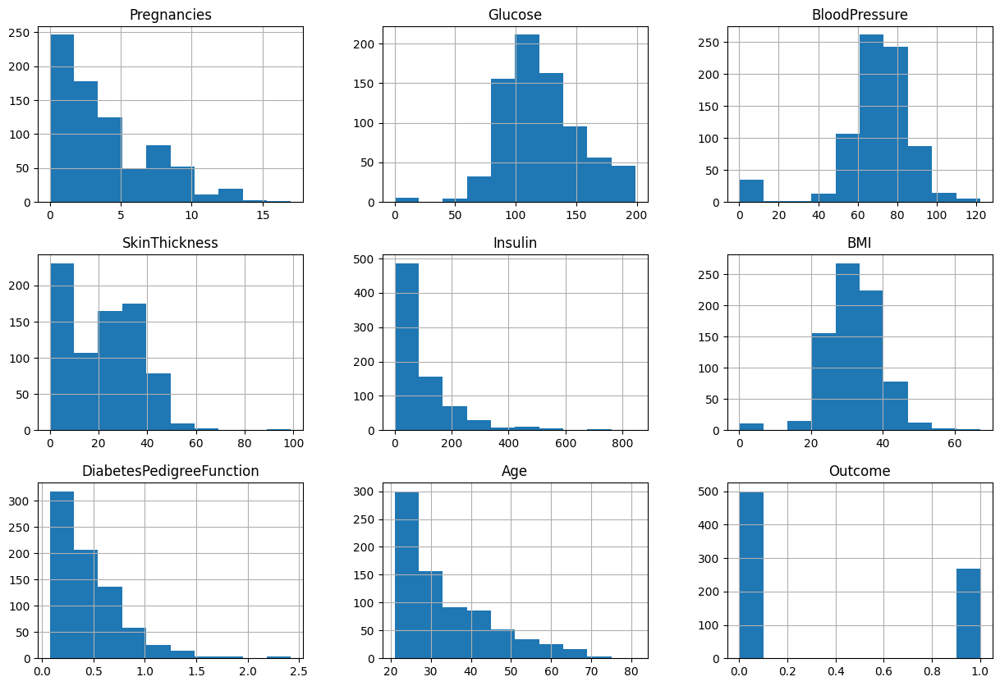

In [3]:
# Histograma
dataset.hist(figsize = (15,10))
plt.show()

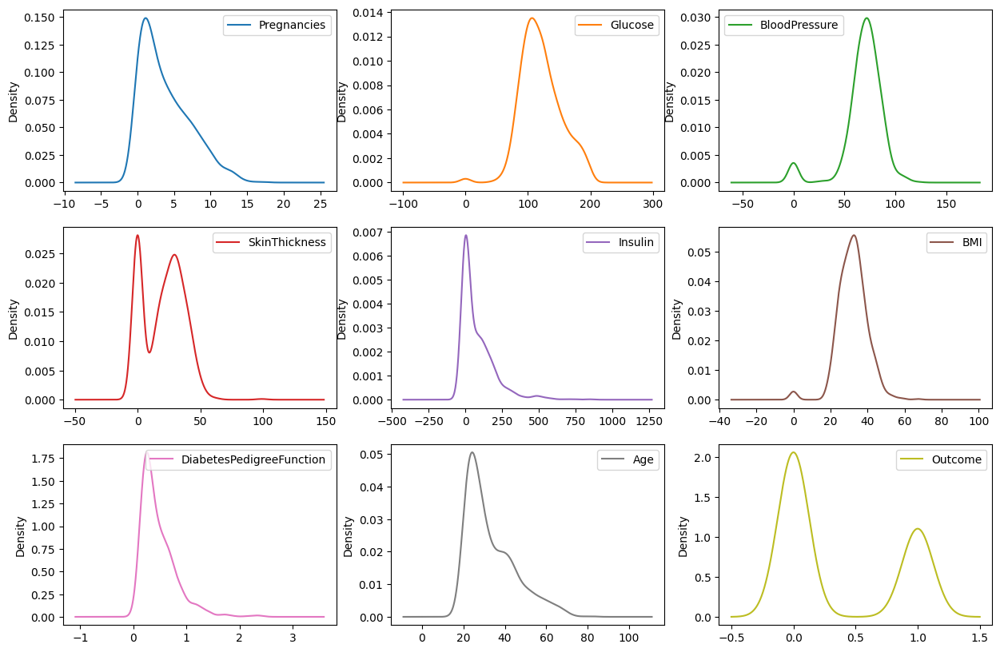

In [4]:
# Density Plot
dataset.plot(kind = 'density', subplots = True, layout = (3,3), sharex = False, figsize = (15,10))
plt.show()

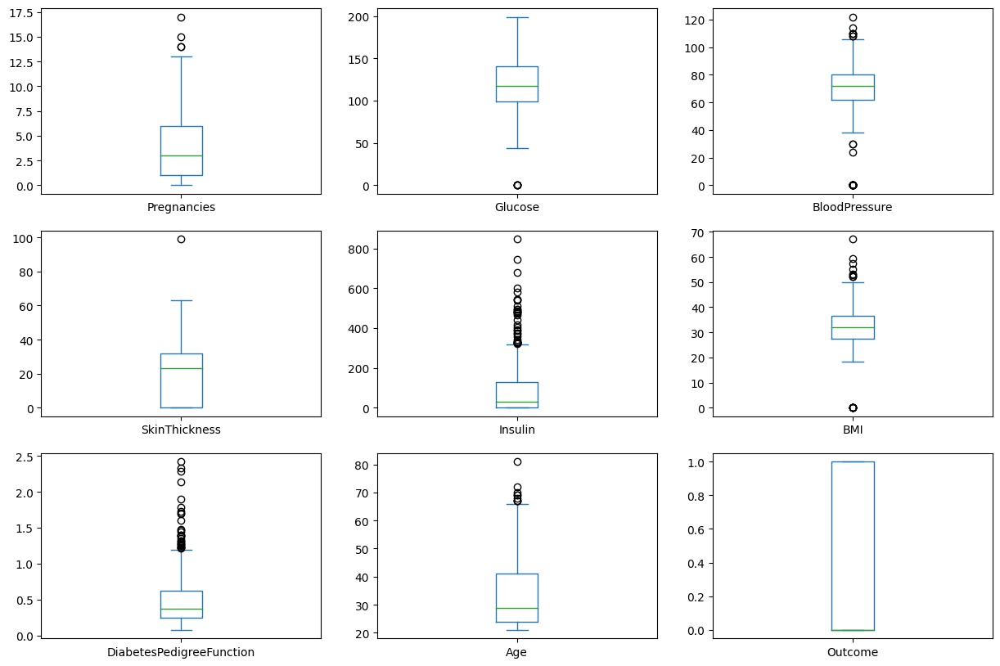

In [5]:
# Boxplot
dataset.plot(kind = 'box', subplots = True, layout = (3,3), sharex = False, sharey = False, figsize = (15,10))
plt.show()

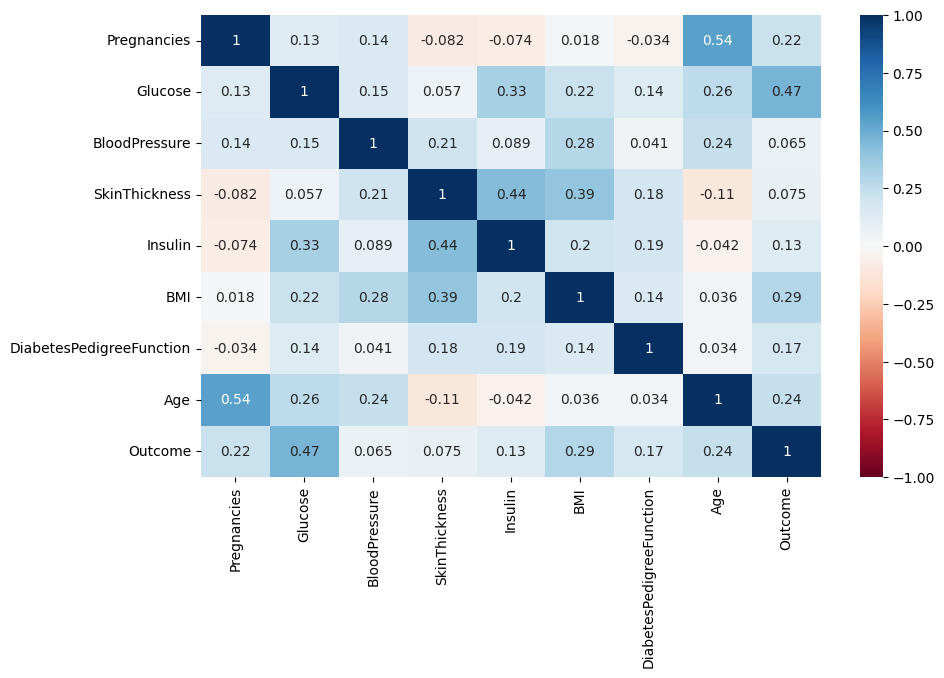

In [6]:
# Matriz de Correlação com Seaborn
plt.figure(figsize = (10,6))
sns.heatmap(dataset.corr(), annot=True, cmap='RdBu', vmin=-1, vmax=1);

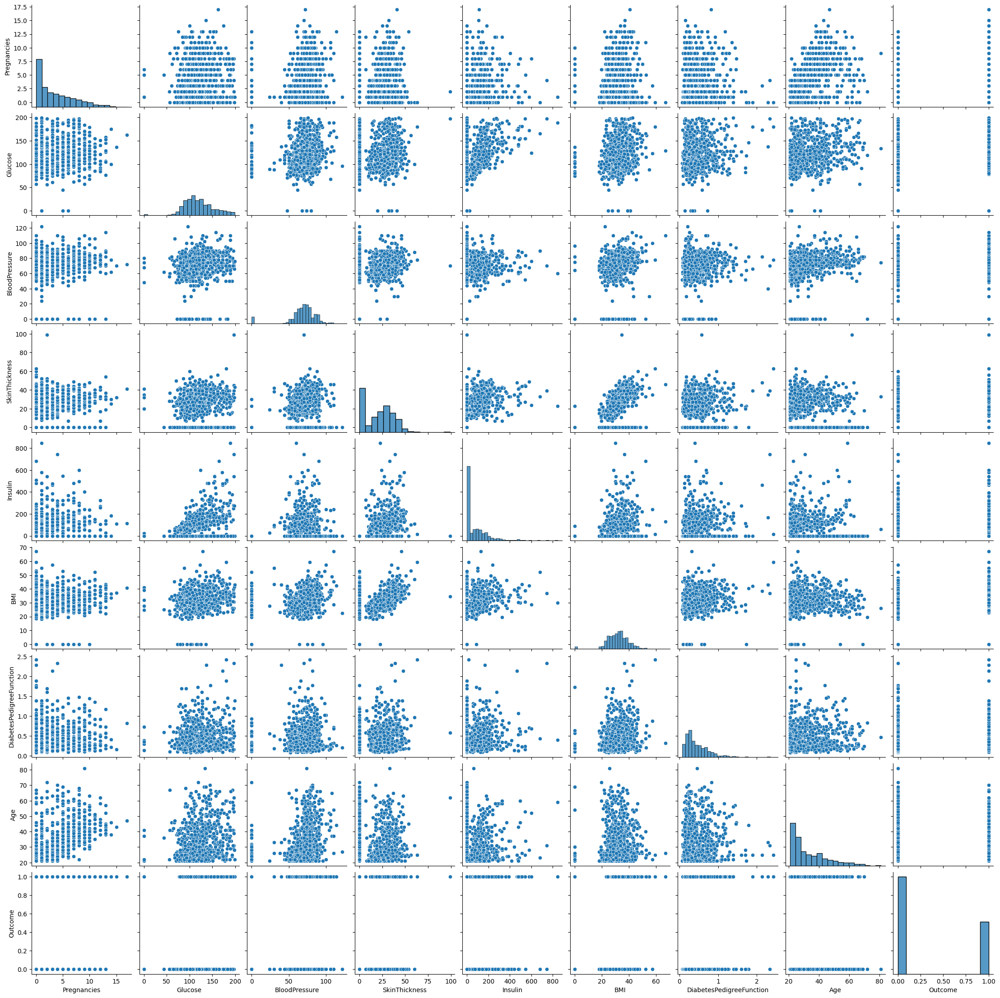

In [7]:
# Scatter Plot com Seaborn - Variação 1
sns.pairplot(dataset)

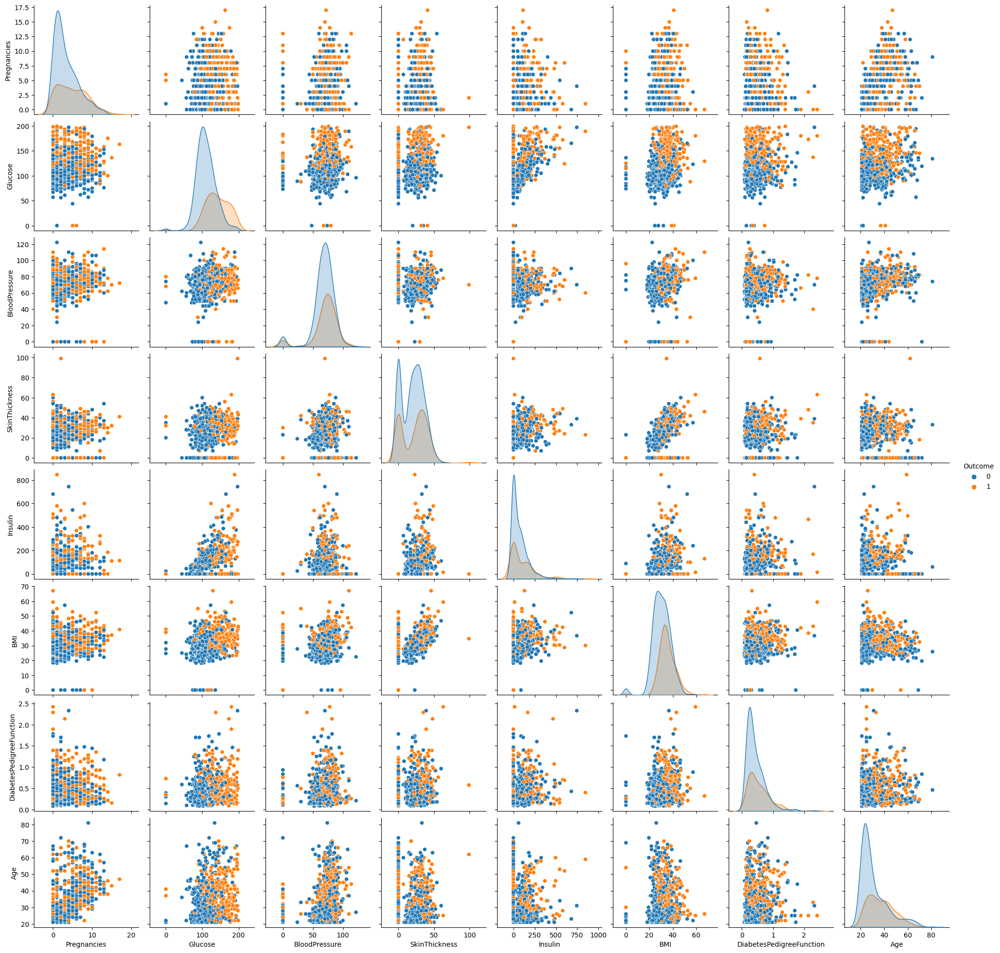

In [8]:
# Scatter Plot com Seaborn - Variação 2
sns.pairplot(dataset, hue = "Outcome", height = 2.5);

In [11]:
# geração do report
profile = ProfileReport(dataset, title='Pandas Profiling Report', html={'style':{'full_width':False}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Pré-processamento

In [13]:
  # verificando nulls no dataset
  dataset.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

<Axes: >

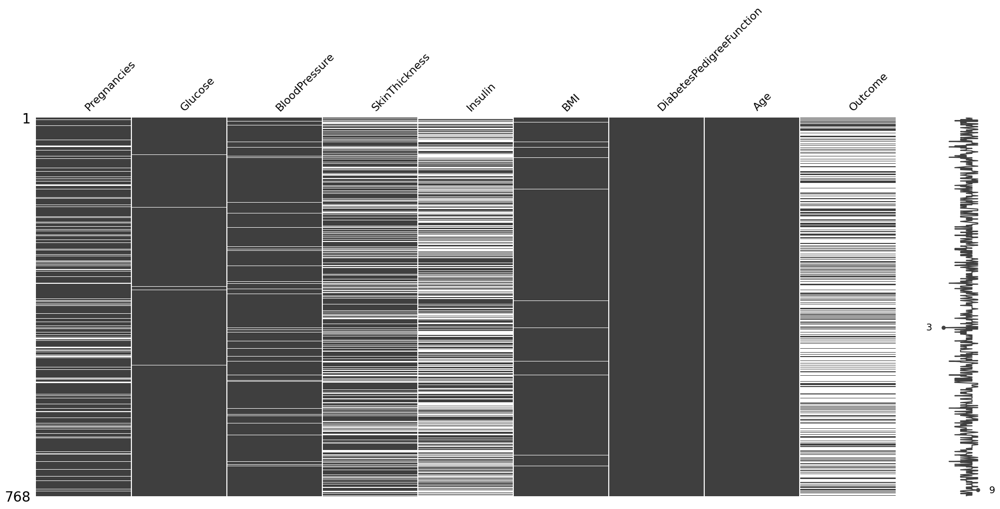

In [18]:
# salvando um novo dataset para tratamento de missings

# recuperando os nomes das colunas
col = list(dataset.columns)

# o novo dataset irá conter todas as colunas do dataset original
datasetSemMissings = dataset[col[:]]

# substituindo os zeros por NaN
datasetSemMissings.replace(0, np.nan, inplace=True)

# exibindo visualização matricial da nulidade do dataset
ms.matrix(datasetSemMissings)

In [19]:
# verificando novamente nulls no dataset
datasetSemMissings.isnull().sum()

Pregnancies                 111
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                     500
dtype: int64

<Axes: >

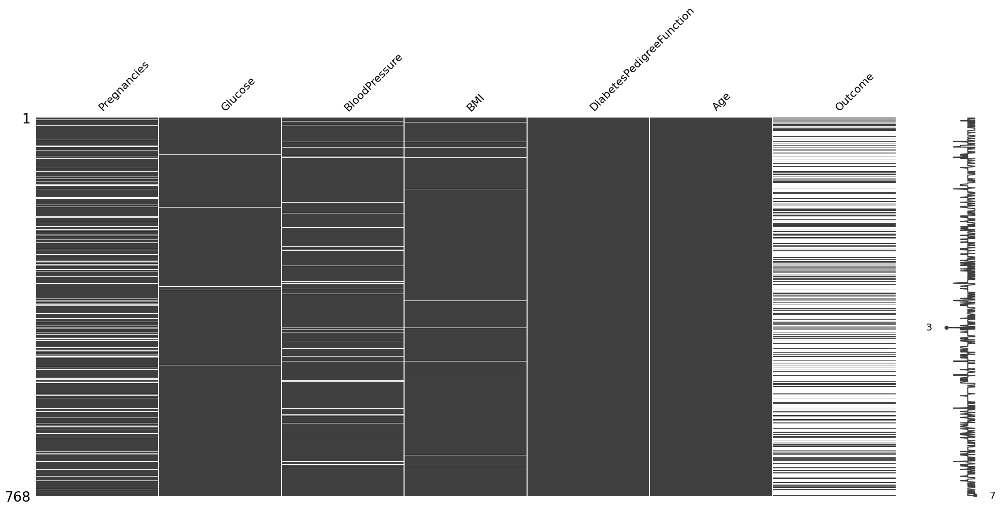

In [20]:
# removendo as colunas 'SkinThickness' e 'Insulin'
datasetSemMissings.drop(['SkinThickness', 'Insulin'], axis=1, inplace= True)

# exibindo visualização matricial da nulidade do dataset
ms.matrix(datasetSemMissings)

<Axes: >

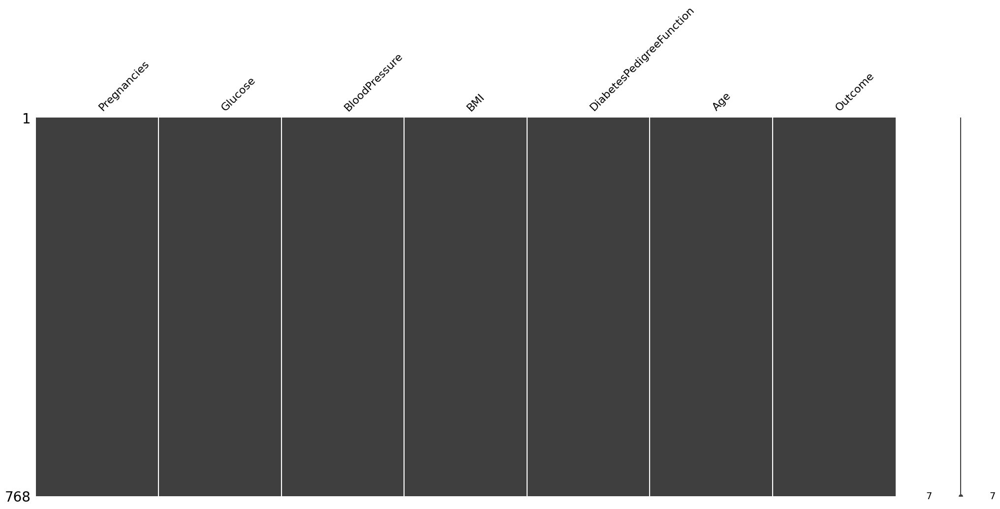

In [21]:
# substituindo os NaN de 'Pregnancies' e 'Outcome' por 0 - voltando aos valores originais destas colunas
datasetSemMissings['Pregnancies'].fillna(0, inplace=True)
datasetSemMissings['Outcome'].fillna(0, inplace=True)

# substituindo os NaN de 'Glucose', 'BloodPressure' e 'BMI' pela mediana da coluna
datasetSemMissings['Glucose'].fillna(datasetSemMissings['Glucose'].median(), inplace=True)
datasetSemMissings['BloodPressure'].fillna(datasetSemMissings['BloodPressure'].median(), inplace=True)
datasetSemMissings['BMI'].fillna(datasetSemMissings['BMI'].median(), inplace=True)

# exibindo visualização matricial da nulidade do dataset
ms.matrix(datasetSemMissings)

In [22]:
# exibindo as primeiras linhas
datasetSemMissings.head()

,Pregnancies,Glucose,BloodPressure,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,33.6,0.627,50,1.0
1,1.0,85.0,66.0,26.6,0.351,31,0.0
2,8.0,183.0,64.0,23.3,0.672,32,1.0
3,1.0,89.0,66.0,28.1,0.167,21,0.0
4,0.0,137.0,40.0,43.1,2.288,33,1.0


In [23]:
# verificando nulls no dataset tratado
datasetSemMissings.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [24]:
# Separando os valores do dataset em componentes de input (X) e output (Y)
X = dataset.values[:,0:8]
Y = dataset.values[:,8]

In [27]:
rescaledX = MinMaxScaler().fit_transform(X)

# Exibindo os dados transformados
print("Dados Originais: \n\n", dataset.values)
print("\nDados Normalizados (não inclui a coluna class): \n\n", rescaledX)

Dados Originais: 

 [[  6.    148.     72.    ...   0.627  50.      1.   ]
 [  1.     85.     66.    ...   0.351  31.      0.   ]
 [  8.    183.     64.    ...   0.672  32.      1.   ]
 ...
 [  5.    121.     72.    ...   0.245  30.      0.   ]
 [  1.    126.     60.    ...   0.349  47.      1.   ]
 [  1.     93.     70.    ...   0.315  23.      0.   ]]

Dados Normalizados (não inclui a coluna class): 

 [[0.35294118 0.74371859 0.59016393 ... 0.50074516 0.23441503 0.48333333]
 [0.05882353 0.42713568 0.54098361 ... 0.39642325 0.11656704 0.16666667]
 [0.47058824 0.91959799 0.52459016 ... 0.34724292 0.25362938 0.18333333]
 ...
 [0.29411765 0.6080402  0.59016393 ... 0.390462   0.07130658 0.15      ]
 [0.05882353 0.63316583 0.49180328 ... 0.4485842  0.11571307 0.43333333]
 [0.05882353 0.46733668 0.57377049 ... 0.45305514 0.10119556 0.03333333]]
